In [217]:
import pandas as pd
import matplotlib.pyplot as plt 
import string
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import plotly.express as exp

In [218]:
user_csv = pd.read_csv("BX-Users.csv")
user_rating = pd.read_csv("BX-Book-Ratings.csv")
book = pd.read_csv("BX-Books.csv")
len(user_csv)
user_csv

,uid,location,age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN
...,...,...,...
206442,278853,"stranraer, n/a, united kingdom",17.0
206443,278855,"tacoma, washington, united kingdom",50.0
206444,278856,"brampton, ontario, canada",NaN
206445,278857,"knoxville, tennessee, usa",NaN


In [219]:
res=book.merge(user_rating , on='isbn' ,how="inner")
res

,isbn,book_title,book_author,year_of_publication,publisher,summary,category,uid,rating
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,Provides an introduction to classical myths pl...,['social science'],2,0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",['actresses'],8,5
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",['actresses'],11400,0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",['actresses'],11676,8
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,"In a small town in Canada, Clara Callan reluct...",['actresses'],41385,0
...,...,...,...,...,...,...,...,...,...
614076,0312266448,The Military Quotation Book : Revised and Expa...,James Charlton,2002,Thomas Dunne Books,"Contains more than 1,200 quotations about war,...",['reference'],278851,0
614077,067161746X,The Bachelor Home Companion: A Practical Guide...,P.J. O'Rourke,1987,Pocket Books,A tongue-in-cheek survival guide for single pe...,['humor'],278851,7
614078,0743203763,As Hogan Said . . . : The 389 Best Things Anyo...,Randy Voorhees,2000,Simon & Schuster,Golf lovers will revel in this collection of t...,['humor'],278851,0
614079,0767907566,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001,Broadway Books,A daring twist on the travel-adventure genre t...,['nature'],278851,5


In [220]:
user_csv.info()
user_csv.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206447 entries, 0 to 206446
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   uid       206447 non-null  int64  
 1   location  206447 non-null  object 
 2   age       122881 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 4.7+ MB


uid             0
location        0
age         83566
dtype: int64

In [221]:
user_csv['age'] = user_csv['age'].fillna(int(user_csv['age'].mean()))
user_csv

,uid,location,age
0,1,"nyc, new york, usa",34.0
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",34.0
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",34.0
...,...,...,...
206442,278853,"stranraer, n/a, united kingdom",17.0
206443,278855,"tacoma, washington, united kingdom",50.0
206444,278856,"brampton, ontario, canada",34.0
206445,278857,"knoxville, tennessee, usa",34.0


In [222]:
#user_csv['location'] = user_csv['location'].str.replace(" " , "")
user_csv

,uid,location,age
0,1,"nyc, new york, usa",34.0
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",34.0
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",34.0
...,...,...,...
206442,278853,"stranraer, n/a, united kingdom",17.0
206443,278855,"tacoma, washington, united kingdom",50.0
206444,278856,"brampton, ontario, canada",34.0
206445,278857,"knoxville, tennessee, usa",34.0


In [223]:
scalar=MinMaxScaler()
scaled_data = scalar.fit_transform(user_csv.drop("location", axis=1))

In [224]:
scaled_df = pd.DataFrame(data = scaled_data,columns=user_csv.columns[1:])
scaled_df['location'] = user_csv['location']
scaled_df

,location,age
0,"nyc, new york, usa",0.147186
1,"stockton, california, usa",0.077922
2,"moscow, yukon territory, russia",0.147186
3,"porto, v.n.gaia, portugal",0.073593
4,"farnborough, hants, united kingdom",0.147186
...,...,...
206442,"stranraer, n/a, united kingdom",0.073593
206443,"tacoma, washington, united kingdom",0.216450
206444,"brampton, ontario, canada",0.147186
206445,"knoxville, tennessee, usa",0.147186


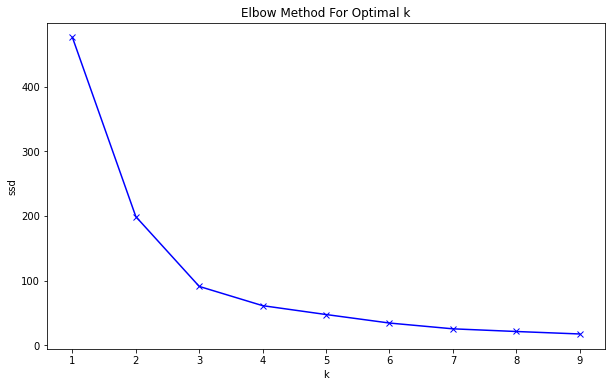

In [225]:
data = scaled_df.drop('location',axis = 1)
# Calculate sum of squared distances
ssd = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data)
    ssd.append(km.inertia_) 
plt.figure(figsize=(10,6))
plt.plot(K, ssd, 'bx-')
plt.xlabel('k')
plt.ylabel('ssd')
plt.title('Elbow Method For Optimal k')
plt.show()

In [226]:
kmean = KMeans(n_clusters=3)
kmean.fit(data)
pred = kmean.labels_

In [227]:
pred
exp.scatter(data_frame= user_csv,x = 'location',y = 'age',color=kmean.labels_)

In [228]:
user_csv

,uid,location,age
0,1,"nyc, new york, usa",34.0
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",34.0
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",34.0
...,...,...,...
206442,278853,"stranraer, n/a, united kingdom",17.0
206443,278855,"tacoma, washington, united kingdom",50.0
206444,278856,"brampton, ontario, canada",34.0
206445,278857,"knoxville, tennessee, usa",34.0


In [229]:
cluster_list = pd.DataFrame()
cluster_list['cluster'] = kmean.labels_

In [230]:
cluster_list
con = pd.concat([cluster_list,user_csv],axis=1, ignore_index=False)
con

,cluster,uid,location,age
0,0,1,"nyc, new york, usa",34.0
1,2,2,"stockton, california, usa",18.0
2,0,3,"moscow, yukon territory, russia",34.0
3,2,4,"porto, v.n.gaia, portugal",17.0
4,0,5,"farnborough, hants, united kingdom",34.0
...,...,...,...,...
206442,2,278853,"stranraer, n/a, united kingdom",17.0
206443,1,278855,"tacoma, washington, united kingdom",50.0
206444,0,278856,"brampton, ontario, canada",34.0
206445,0,278857,"knoxville, tennessee, usa",34.0


In [231]:
merged_data = con.merge(res,how="inner" , on='uid')

In [232]:
merged_data=merged_data.drop(columns=['publisher','category','year_of_publication'])
merged_data

,cluster,uid,location,age,isbn,book_title,book_author,summary,rating
0,2,2,"stockton, california, usa",18.0,0195153448,Classical Mythology,Mark P. O. Morford,Provides an introduction to classical myths pl...,0
1,0,9,"germantown, tennessee, usa",34.0,0440234743,The Testament,John Grisham,"A suicidal billionaire, a burnt-out Washington...",0
2,0,9,"germantown, tennessee, usa",34.0,0452264464,Beloved (Plume Contemporary Fiction),Toni Morrison,Staring unflinchingly into the abyss of slaver...,6
3,0,9,"germantown, tennessee, usa",34.0,0609804618,Our Dumb Century: The Onion Presents 100 Years...,The Onion,The staff of The Onion presents a satirical co...,0
4,0,12,"fort bragg, california, usa",34.0,1879384493,If I'd Known Then What I Know Now: Why Not Lea...,J. R. Parrish,Provides advice on ways to succeed in business...,10
...,...,...,...,...,...,...,...,...,...
42703,2,278849,"georgetown, ontario, canada",23.0,0445210214,Mythology 101 (Questar Fantasy),Jody Lynn Nye,Keith Doyle is determined in his campaign to t...,0
42704,2,278849,"georgetown, ontario, canada",23.0,0771012837,"Klondike: The Last Great Gold Rush, 1896-1899",Pierre Berton,The Klondike stampede was a wild interlude in ...,0
42705,2,278849,"georgetown, ontario, canada",23.0,0380698439,Behind the Attic Wall (Avon Camelot Books (Pap...,Sylvia Cassedy,"In the bleak, forbidding house of her great-au...",9
42706,2,278849,"georgetown, ontario, canada",23.0,0920656307,Secret of Willow Castle,Ly Cook,Canadian story early 19th century Orphaned ser...,0


In [233]:
#cluster_map = merged_data.groupby(['cluster', 'location'])['rating'].mean().reset_index().sort_values(['cluster','rating'],ascending=False)


In [234]:
cluster0 = merged_data[(merged_data["cluster"]==0)]
cluster1 = merged_data[(merged_data['cluster']==1)]
cluster2 = merged_data[(merged_data['cluster']==2)]
cluster0

,cluster,uid,location,age,isbn,book_title,book_author,summary,rating
1,0,9,"germantown, tennessee, usa",34.0,0440234743,The Testament,John Grisham,"A suicidal billionaire, a burnt-out Washington...",0
2,0,9,"germantown, tennessee, usa",34.0,0452264464,Beloved (Plume Contemporary Fiction),Toni Morrison,Staring unflinchingly into the abyss of slaver...,6
3,0,9,"germantown, tennessee, usa",34.0,0609804618,Our Dumb Century: The Onion Presents 100 Years...,The Onion,The staff of The Onion presents a satirical co...,0
4,0,12,"fort bragg, california, usa",34.0,1879384493,If I'd Known Then What I Know Now: Why Not Lea...,J. R. Parrish,Provides advice on ways to succeed in business...,10
5,0,14,"mediapolis, iowa, usa",34.0,0061076031,Mary-Kate & Ashley Switching Goals (Mary-Kate ...,Mary-Kate & Ashley Olsen,Problems arise when identical twins Emma and S...,5
...,...,...,...,...,...,...,...,...,...
42693,0,278813,"phoenix, arizona, usa",34.0,0375726403,Empire Falls,Richard Russo,"Whiting, the heir to a faded logging and texti...",0
42696,0,278819,"surfside beach, texas, usa",32.0,0385511612,Bleachers,John Grisham,From the best-selling author of The Painted Ho...,0
42698,0,278825,"portland, oregon, usa",34.0,0805047379,The Sweetheart Season: A Novel,Karen Joy Fowler,"In 1947, the bucolic mill town of Magrit, Minn...",5
42699,0,278831,"anchorage, alaska, usa",34.0,0449205193,The Wicked Day,Mary Stewart,"Mordred, the son of King Arthur and his treach...",10


In [244]:
#NOW WE WANT TO PREDICT RATING WITH SAME CLUSTER USERS 
cluster0
#avg_book_rating = cluster0.groupby('rating')['book_title'].mean()


cluster0['rating'].replace(to_replace = 0, value = cluster0['rating'].mean(), inplace=True)
cluster0

/tmp/ipykernel_5933/2977718956.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,cluster,uid,location,age,isbn,book_title,book_author,summary,rating
1,0,9,"germantown, tennessee, usa",34.0,0440234743,The Testament,John Grisham,"A suicidal billionaire, a burnt-out Washington...",4.579796
2,0,9,"germantown, tennessee, usa",34.0,0452264464,Beloved (Plume Contemporary Fiction),Toni Morrison,Staring unflinchingly into the abyss of slaver...,6.000000
3,0,9,"germantown, tennessee, usa",34.0,0609804618,Our Dumb Century: The Onion Presents 100 Years...,The Onion,The staff of The Onion presents a satirical co...,4.579796
4,0,12,"fort bragg, california, usa",34.0,1879384493,If I'd Known Then What I Know Now: Why Not Lea...,J. R. Parrish,Provides advice on ways to succeed in business...,10.000000
5,0,14,"mediapolis, iowa, usa",34.0,0061076031,Mary-Kate & Ashley Switching Goals (Mary-Kate ...,Mary-Kate & Ashley Olsen,Problems arise when identical twins Emma and S...,5.000000
...,...,...,...,...,...,...,...,...,...
42693,0,278813,"phoenix, arizona, usa",34.0,0375726403,Empire Falls,Richard Russo,"Whiting, the heir to a faded logging and texti...",4.579796
42696,0,278819,"surfside beach, texas, usa",32.0,0385511612,Bleachers,John Grisham,From the best-selling author of The Painted Ho...,4.579796
42698,0,278825,"portland, oregon, usa",34.0,0805047379,The Sweetheart Season: A Novel,Karen Joy Fowler,"In 1947, the bucolic mill town of Magrit, Minn...",5.000000
42699,0,278831,"anchorage, alaska, usa",34.0,0449205193,The Wicked Day,Mary Stewart,"Mordred, the son of King Arthur and his treach...",10.000000


In [239]:
#na_cluster0 = avg_book_rating[(avg_book_rating['rating']==0)]
#na_cluster0


